In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.autograd import Variable
from torchvision.utils import save_image
from PIL import Image
import itertools
import random

import torchvision.datasets as datasets
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cp '/content/drive/My Drive/data/facades.tar.gz' '/content/facades.tar.gz'
!tar -xf *.gz


In [ ]:
train_path = '/content/facades/train'
val_path = '/content/facades/val'
test_path = '/content/facades/test'

batch_size = 64

In [ ]:
class dataset(torch.utils.data.Dataset):
    def __init__(self, file_dir, transform=None):
        self.file_dir = file_dir
        self.file_list = [x for x in sorted(os.listdir(self.file_dir))]
        self.transform = transform
        
    def __len__(self):
        self.filelength = len(self.file_list)
        return self.filelength
    
    def __getitem__(self,idx):
        img_path = os.path.join(self.file_dir,self.file_list[idx])
        img = Image.open(img_path)

        input = img.crop((img.width // 2, 0, img.width, img.height))
        target = img.crop((0, 0, img.width // 2, img.height))

        if self.transform is not None:
            input = self.transform(input)
            target = self.transform(target)

        return input, target

In [ ]:
transform = transforms.Compose([transforms.Resize(128),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

In [ ]:
train_data = dataset(train_path, transform = transform)
train_data_loader = torch.utils.data.DataLoader(dataset = train_data,
                                                batch_size = batch_size,
                                                shuffle=True)

test_data = dataset(test_path, transform = transform)
test_data_loader = torch.utils.data.DataLoader(dataset = test_data,
                                               batch_size = batch_size,
                                               shuffle=False)

In [ ]:
class ConvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, activation=True, batchnorm=True):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(input_size, output_size, kernel_size, stride, padding)
        self.activation = activation
        self.lrelu = nn.LeakyReLU(0.2, True)
        self.batchnorm = batchnorm
        self.bn = nn.BatchNorm2d(output_size)

    def forward(self, x):
        out = self.conv(self.lrelu(x)) if self.activation else self.conv(x)
        result = self.bn(out) if self.batchnorm else out
        return result


In [ ]:
class DeconvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, batchnorm = True, dropout=False):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(input_size, output_size, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(output_size)
        self.dropout = nn.Dropout(0.5)
        self.relu = nn.ReLU(True)
        self.batchnorm = batchnorm
        self.isdropout = dropout

    def forward(self, x):
        out = self.bn(self.deconv(self.relu(x))) if self.batchnorm else self.deconv(self.relu(x))
        result = self.dropout(out) if self.isdropout else out
        return result

In [ ]:
class Generator(torch.nn.Module):
    def __init__(self, input_dim, num_filter, output_dim):
        super(Generator, self).__init__()

        # Encoder
        self.conv1 = ConvBlock(input_dim, num_filter, activation=False, batchnorm=False)
        self.conv2 = ConvBlock(num_filter, num_filter * 2)
        self.conv3 = ConvBlock(num_filter * 2, num_filter * 4)
        self.conv4 = ConvBlock(num_filter * 4, num_filter * 8)
        self.conv5 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv6 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv7 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv8 = ConvBlock(num_filter * 8, num_filter * 8, batchnorm=False, activation=False) #activation?
        # Decoder
        self.deconv1 = DeconvBlock(num_filter * 8, num_filter * 8, dropout=True)
        self.deconv2 = DeconvBlock(num_filter * 8 * 2, num_filter * 8, dropout=True)
        self.deconv3 = DeconvBlock(num_filter * 8 * 2, num_filter * 8, dropout=True)
        self.deconv4 = DeconvBlock(num_filter * 8 * 2, num_filter * 8)
        self.deconv5 = DeconvBlock(num_filter * 8 * 2, num_filter * 4)
        self.deconv6 = DeconvBlock(num_filter * 4 * 2, num_filter * 2)
        self.deconv7 = DeconvBlock(num_filter * 2 * 2, num_filter)
        self.deconv8 = DeconvBlock(num_filter * 2, output_dim, batchnorm=False)

    def forward(self, x):
        enc1 = self.conv1(x)
        enc2 = self.conv2(enc1)
        enc3 = self.conv3(enc2)
        enc4 = self.conv4(enc3)
        enc5 = self.conv5(enc4)
        enc6 = self.conv6(enc5)
        enc7 = self.conv7(enc6)
        enc8 = self.conv8(enc7)

        dec1 = self.deconv1(enc8)
        dec1 = torch.cat([dec1, enc7], 1)
        dec2 = self.deconv2(dec1)
        dec2 = torch.cat([dec2, enc6], 1)
        dec3 = self.deconv3(dec2)
        dec3 = torch.cat([dec3, enc5], 1)
        dec4 = self.deconv4(dec3)
        dec4 = torch.cat([dec4, enc4], 1)
        dec5 = self.deconv5(dec4)
        dec5 = torch.cat([dec5, enc3], 1)
        dec6 = self.deconv6(dec5)
        dec6 = torch.cat([dec6, enc2], 1)
        dec7 = self.deconv7(dec6)
        dec7 = torch.cat([dec7, enc1], 1)
        dec8 = self.deconv8(dec7)
        out = torch.nn.Tanh()(dec8)
        return out

    def normal_weight_init(self, mean=0.0, std=0.02):
        for m in self.children():
            if isinstance(m, ConvBlock):
                nn.init.normal(m.conv.weight, mean, std)
            if isinstance(m, DeconvBlock):
                nn.init.normal(m.deconv.weight, mean, std)


In [ ]:
class Discriminator(torch.nn.Module):
    def __init__(self, input_dim, num_filter, output_dim):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            ConvBlock(input_dim, num_filter, activation=False, batchnorm=False),
            ConvBlock(num_filter, num_filter * 2),
            ConvBlock(num_filter * 2, num_filter * 4),
            ConvBlock(num_filter * 4, num_filter * 8, stride=1),
            ConvBlock(num_filter * 8, output_dim, stride=1, batchnorm=False))

    def forward(self, x, label):
        x = torch.cat([x, label], 1)
        x = self.discriminator(x)
        out = nn.Sigmoid()(x)
        return out

    def normal_weight_init(self, mean=0.0, std=0.02):
        for m in self.children():
            if isinstance(m, ConvBlock):
                nn.init.normal(m.conv.weight, mean, std)

In [ ]:
def do_pix2pix_epoch(input, target, i, device):
      x = Variable(input.to(device))
      y = Variable(target.to(device))

      d_real_decision = discriminator(x, y).squeeze()
      real_data = Variable(torch.ones(d_real_decision.size()).to(device))
      d_real_loss = BCE_loss(d_real_decision, real_data)

      gen_image = generator(x)
      d_fake_decision = discriminator(x, gen_image).squeeze()
      fake = Variable(torch.zeros(d_fake_decision.size()).to(device))
      d_fake_loss = BCE_loss(d_fake_decision, fake)

      d_loss = (d_real_loss + d_fake_loss) * 0.5
      discriminator.zero_grad()
      d_loss.backward()
      d_optimizer.step()

      gen_image = generator(x)
      d_fake_decision = discriminator(x, gen_image).squeeze()
      g_fake_loss = BCE_loss(d_fake_decision, real_data)

      l1_loss = 100 * L1_loss(gen_image, y) # 

      g_loss = g_fake_loss + l1_loss
      generator.zero_grad()
      g_loss.backward()
      g_optimizer.step()

      return gen_image, d_loss, g_loss

In [ ]:
def train(dataloader, device, do_epoch=None, num_epochs=10, sample_dir="data/images/gan", generate_every=100):
    d_losses, g_losses = [], []
    for epoch in range(num_epochs):
        for i, (imgs, targets) in enumerate(dataloader):
            gen_imgs, d_loss, g_loss = do_epoch(imgs, targets, i, device)
            if d_loss is not None and g_loss is not None:
                d_losses.append(d_loss.item())
                g_losses.append(g_loss.item())
            batches_done = epoch * len(dataloader) + i
            if batches_done % generate_every == 0:
                print("Epoch %d/%d batch %d/%d D loss: %.6f G loss: %.6f" % \
                      (epoch, num_epochs, i, len(dataloader), d_losses[-1], g_losses[-1]))
                save_image(gen_imgs.data[:25], "%s/%05d.png" % (sample_dir, batches_done), nrow=5, normalize=True)
    return d_losses, g_losses

In [ ]:
generator = Generator(3, 64, 3)
discriminator = Discriminator(6, 64, 1)
cuda = True if torch.cuda.is_available() else False
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
generator.to(device)
discriminator.to(device)
  
generator.normal_weight_init(mean=0.0, std=0.02)
discriminator.normal_weight_init(mean=0.0, std=0.02)

BCE_loss = nn.BCELoss().to(device)
L1_loss = nn.L1Loss().to(device)

lr_g, lr_d, beta1, beta2 = 0.0002, 0.0002, 0.5, 0.999
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:57: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.


In [ ]:
!rm -rf /content/test/*.png
d_losses, g_losses = train(train_data_loader, device, do_pix2pix_epoch, num_epochs=200, sample_dir="/content/test", generate_every=100)

Epoch 0/200 batch 0/7 D loss: 0.722859 G loss: 42.932014
Epoch 14/200 batch 2/7 D loss: 0.169587 G loss: 27.543797
Epoch 28/200 batch 4/7 D loss: 0.323343 G loss: 24.723848
Epoch 42/200 batch 6/7 D loss: 0.476373 G loss: 22.055769
Epoch 57/200 batch 1/7 D loss: 0.575370 G loss: 20.146509
Epoch 71/200 batch 3/7 D loss: 0.493832 G loss: 18.472012
Epoch 85/200 batch 5/7 D loss: 0.462453 G loss: 16.918274
Epoch 100/200 batch 0/7 D loss: 0.732541 G loss: 17.163282
Epoch 114/200 batch 2/7 D loss: 0.450215 G loss: 15.666716
Epoch 128/200 batch 4/7 D loss: 0.483682 G loss: 15.354664
Epoch 142/200 batch 6/7 D loss: 0.452708 G loss: 13.701936
Epoch 157/200 batch 1/7 D loss: 0.592994 G loss: 15.743974
Epoch 171/200 batch 3/7 D loss: 0.426239 G loss: 13.245420
Epoch 185/200 batch 5/7 D loss: 0.504906 G loss: 12.555342


In [ ]:
def plot_losses(losses, capture):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111)

    n_epochs = len(losses) - 1
    x = np.linspace(0, n_epochs, len(losses))

    ax.plot(x, losses, label=capture)
    ax.legend()
    plt.xlabel('Эпоха обучения')
    plt.ylabel('Ошибка')

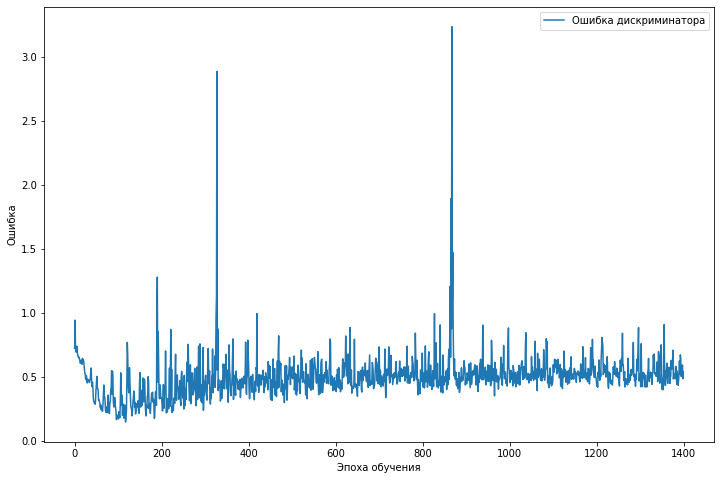

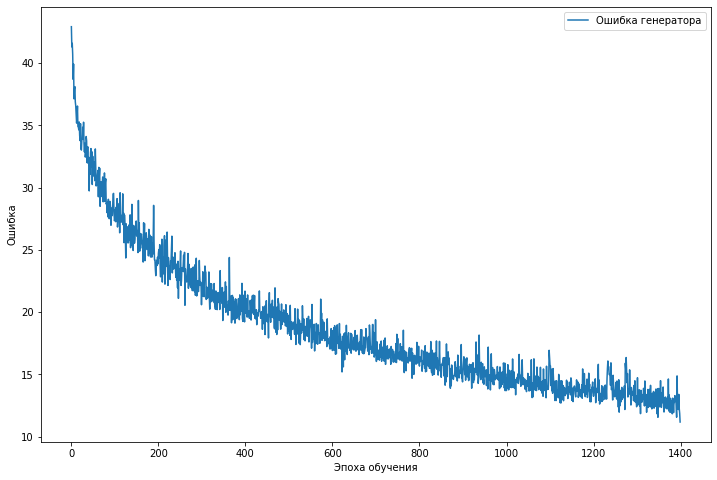

In [ ]:


plot_losses(d_losses, 'Ошибка дискриминатора')
plot_losses(g_losses, 'Ошибка генератора')

Посмотрим, как менялся результат по ходу обучения.

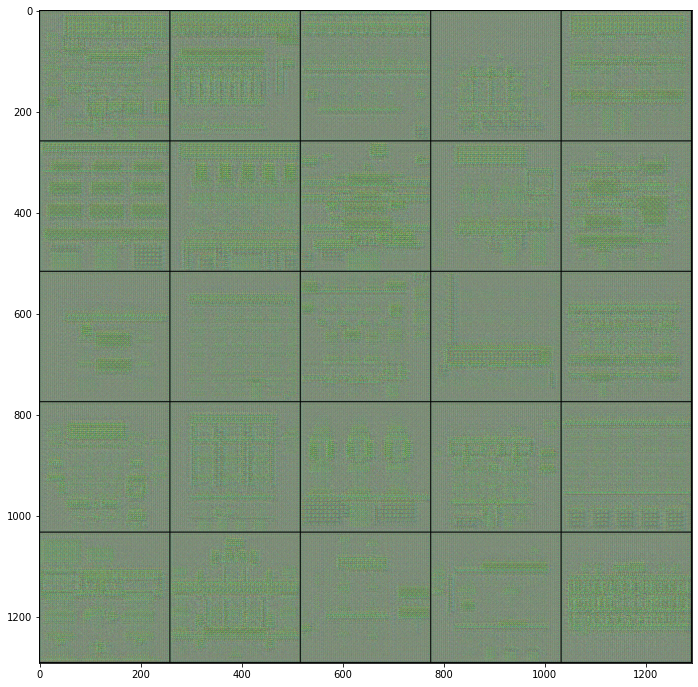

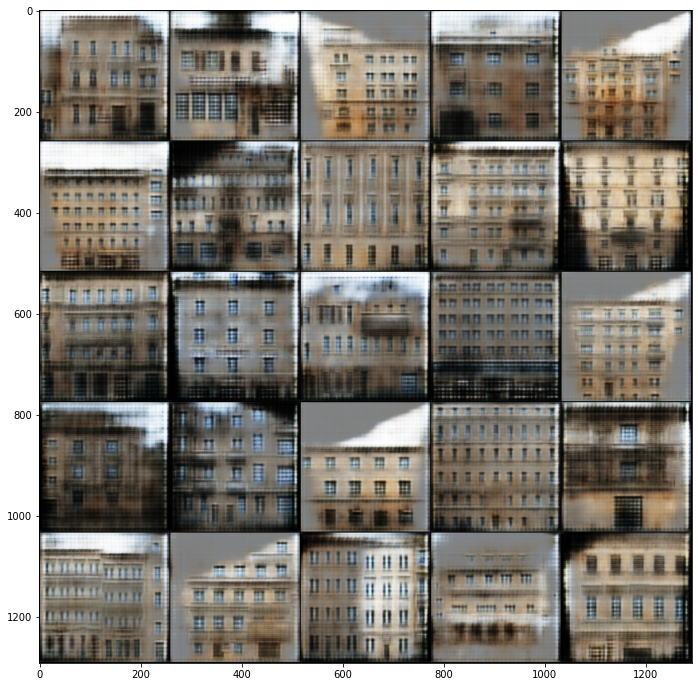

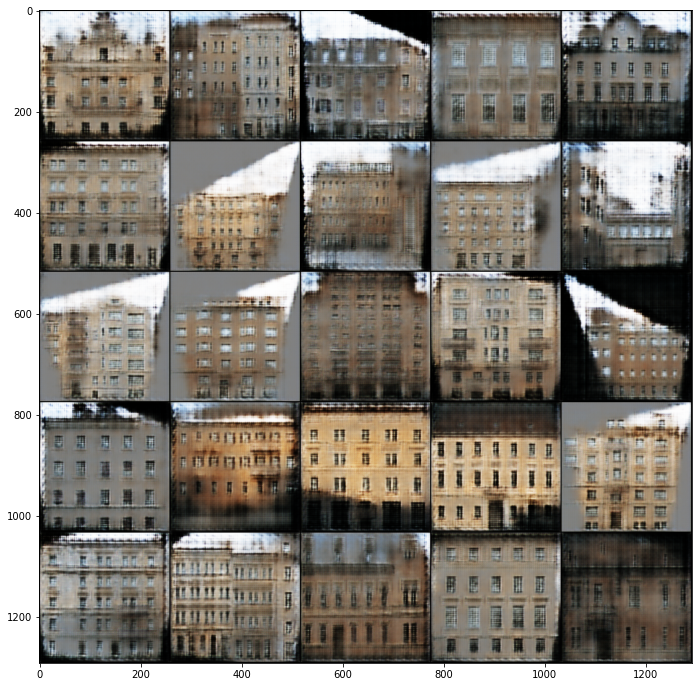

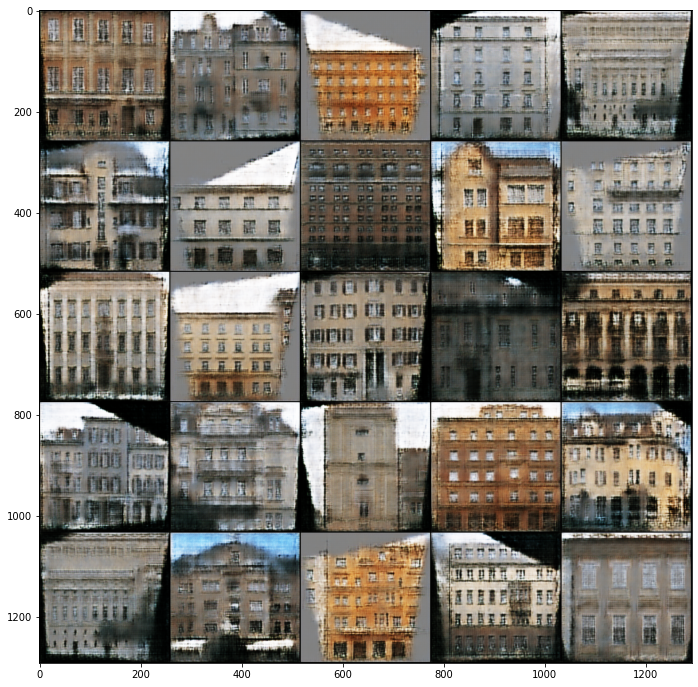

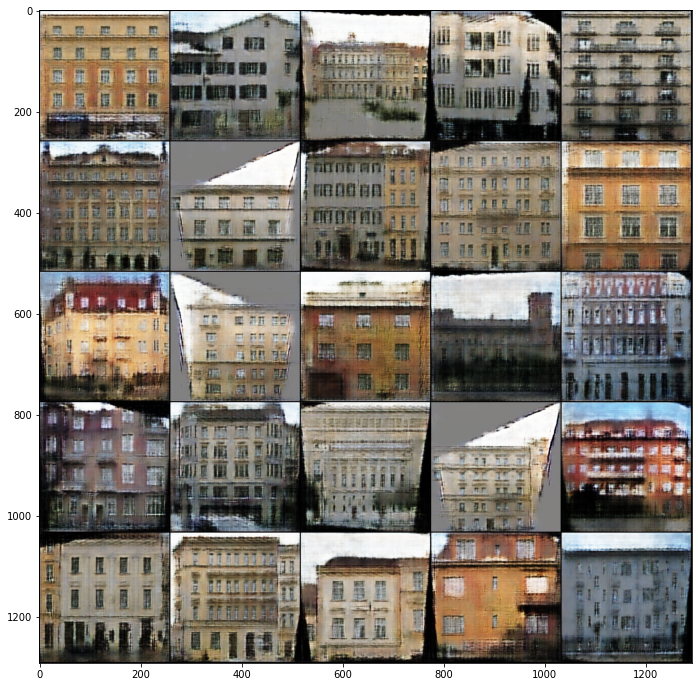

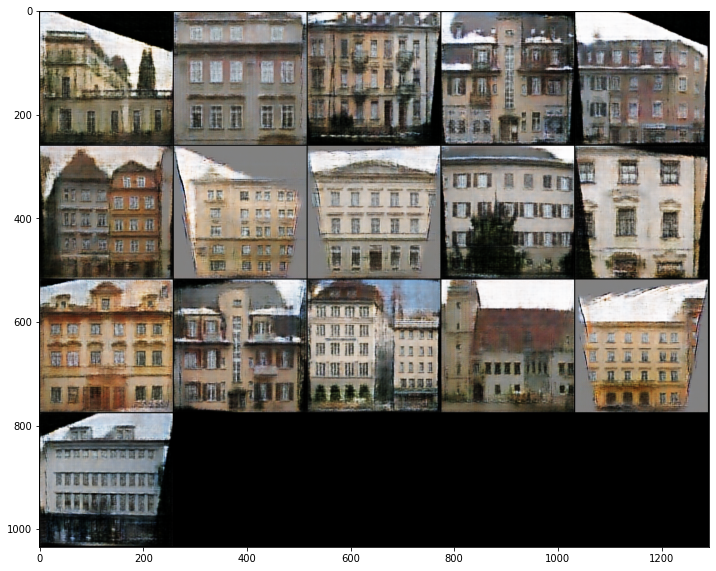

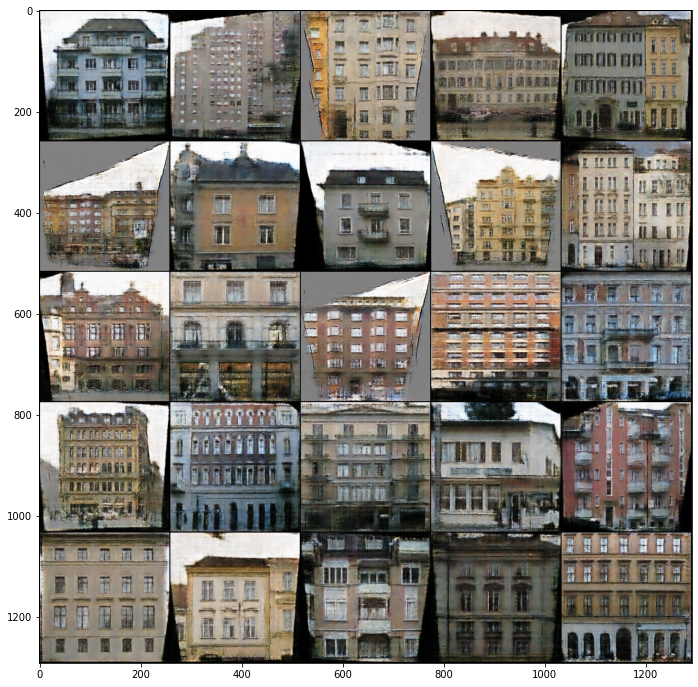

In [ ]:
sample_dir = '/content/test'
for i in range(0, 1400, 200):
  img_path = "%s/%05d.png" % (sample_dir, i)
  sample_image = Image.open(img_path)
  plt.figure(figsize = (12,12))
  plt.imshow(sample_image) 
plt.show()

In [ ]:
class CycleConvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, activation=True, batchnorm=True):
        super(CycleConvBlock, self).__init__()
        self.conv = nn.Conv2d(input_size, output_size, kernel_size, stride, padding)
        self.activation = activation
        self.lrelu = nn.LeakyReLU(0.2, True)
        self.batchnorm = batchnorm
        self.inorm = nn.InstanceNorm2d(output_size)

    def forward(self, x):
        out = self.conv(self.lrelu(x)) if self.activation else self.conv(x)
        result = self.inorm(out) if self.batchnorm else out
        return result

In [ ]:
class CycleDiscriminator(torch.nn.Module):
    def __init__(self):
        super(CycleDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, padding=1),
        )

    def forward(self, x):
        x = self.model(x)
        x = F.avg_pool2d(x, x.size()[2:])
        x = torch.flatten(x, 1)
        return x

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()

        self.res = nn.Sequential(nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels),
                                 nn.ReLU(inplace=True),
                                 nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels))

    def forward(self, x):
        return x + self.res(x)

In [ ]:
class CycleGenerator(nn.Module):
    def __init__(self):
        super(CycleGenerator, self).__init__()
        self.model = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(3, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),

            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 7),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)

In [ ]:
class CycleDataset(torch.utils.data.Dataset):
    def __init__(self, file_dir, transform=None, unpaired = True):
        self.file_dir = file_dir
        self.file_list = [x for x in sorted(os.listdir(self.file_dir))]
        self.transform = transform
        self.unpaired = unpaired
        
    def __len__(self):
        self.filelength = len(self.file_list)
        return self.filelength
    
    def __getitem__(self,idx):
        img_path = os.path.join(self.file_dir,self.file_list[idx])
        img = Image.open(img_path)

        input = img.crop((img.width // 2, 0, img.width, img.height))

        if self.unpaired:
          idx1 = random.randint(0, len(self.file_list) - 1)
          img_path = os.path.join(self.file_dir,self.file_list[idx1])
          img = Image.open(img_path)

        target = img.crop((0, 0, img.width // 2, img.height))

        if self.transform is not None:
            input = self.transform(input)
            target = self.transform(target)

        return input, target

In [ ]:
class ReplayBuffer:
    def __init__(self, max_size = 50):
        assert (max_size > 0), "Empty buffer!"
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

In [67]:
batch_size = 16
transform = transforms.Compose([transforms.Resize(128),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

train_cycle_data = CycleDataset(train_path, transform = transform, unpaired = True)
train_cycle_data_loader = torch.utils.data.DataLoader(dataset = train_cycle_data,
                                                batch_size = batch_size,
                                                shuffle=True)

In [68]:
def train_cycle(dataloader, device, do_epoch=None, num_epochs=10, sample_dir="data/images/gan", generate_every=100):
    g_losses = []
    d_losses = []

    identity_losses = []
    gan_losses = []
    cycle_losses = []

    fake_A_buffer = ReplayBuffer(10)
    fake_B_buffer = ReplayBuffer(10)

    for epoch in range(num_epochs):
        for i, (imgs, targets) in enumerate(dataloader):
            identity_loss, gan_loss, cycle_loss, _, fake_imgs, _  = do_cycle_epoch(imgs, targets, i, device, fake_A_buffer, fake_B_buffer)
            if identity_loss is not None and gan_loss is not None and cycle_loss is not None:
                identity_losses.append(identity_loss)
                gan_losses.append(gan_loss)
                cycle_losses.append(cycle_loss)
            batches_done = epoch * len(dataloader) + i
            if batches_done % generate_every == 0:
                print("Epoch %d/%d batch %d/%d identity loss: %.6f gan loss: %.6f cycle loss: %.6f" % \
                      (epoch, num_epochs, i, len(dataloader), identity_losses[-1], gan_losses[-1], cycle_losses[-1]))
                save_image(fake_imgs.data[:5], "%s/%05d.png" % (sample_dir, batches_done), nrow=5, normalize=True)
    return identity_losses, gan_losses, cycle_losses



In [69]:
def do_cycle_epoch(A, B, i, device, fake_A_buffer, fake_B_buffer):
        real_image_A = A.to(device)
        real_image_B = B.to(device)
        batch_size = real_image_A.size(0)

        real_label = torch.full((batch_size, 1), 1, device=device, dtype=torch.float32)
        fake_label = torch.full((batch_size, 1), 0, device=device, dtype=torch.float32)

        optimizer_G.zero_grad()

        identity_image_A = generatorB2A(real_image_A)
        loss_identity_A = identity_loss(identity_image_A, real_image_A) * 5.0

        identity_image_B = generatorA2B(real_image_B)
        loss_identity_B = identity_loss(identity_image_B, real_image_B) * 5.0

        fake_image_A = generatorB2A(real_image_B)
        fake_output_A = discriminatorA(fake_image_A)
        loss_GAN_B2A = adversarial_loss(fake_output_A, real_label)

        fake_image_B = generatorA2B(real_image_A)
        fake_output_B = discriminatorB(fake_image_B)
        loss_GAN_A2B = adversarial_loss(fake_output_B, real_label)

        recovered_image_A = generatorB2A(fake_image_B)
        loss_cycle_ABA = cycle_loss(recovered_image_A, real_image_A) * 10.0

        recovered_image_B = generatorA2B(fake_image_A)
        loss_cycle_BAB = cycle_loss(recovered_image_B, real_image_B) * 10.0

        errG = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB

        errG.backward()
        optimizer_G.step()

        optimizer_D_A.zero_grad()

        real_output_A = discriminatorA(real_image_A)
        errD_real_A = adversarial_loss(real_output_A, real_label)

        fake_image_A = fake_A_buffer.push_and_pop(fake_image_A)
        fake_output_A = discriminatorA(fake_image_A.detach())
        errD_fake_A = adversarial_loss(fake_output_A, fake_label)

        errD_A = (errD_real_A + errD_fake_A) / 2
        errD_A.backward()
        optimizer_D_A.step()

        optimizer_D_B.zero_grad()
        real_output_B = discriminatorB(real_image_B)
        errD_real_B = adversarial_loss(real_output_B, real_label)

        fake_image_B = fake_B_buffer.push_and_pop(fake_image_B)
        fake_output_B = discriminatorB(fake_image_B.detach())
        errD_fake_B = adversarial_loss(fake_output_B, fake_label)

        errD_B = (errD_real_B + errD_fake_B) / 2

        errD_B.backward()
        optimizer_D_B.step()

        loss_G_identity = (loss_identity_A + loss_identity_B).item()
        loss_G_GAN = (loss_GAN_A2B + loss_GAN_B2A).item()
        loss_G_cycle = (loss_cycle_ABA + loss_cycle_BAB).item()

        fake_image_A = 0.5 * (generatorB2A(real_image_B).data + 1.0)
        fake_image_B = 0.5 * (generatorA2B(real_image_A).data + 1.0)
        torch.cuda.empty_cache()
        return loss_G_identity, loss_G_GAN, loss_G_cycle, fake_image_A, fake_image_B, fake_output_B

In [70]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
generatorA2B = CycleGenerator().to(device)
generatorB2A = CycleGenerator().to(device)
discriminatorA = CycleDiscriminator().to(device)
discriminatorB = CycleDiscriminator().to(device)

generatorA2B.apply(weights_init)
generatorB2A.apply(weights_init)
discriminatorA.apply(weights_init)
discriminatorB.apply(weights_init)

cycle_loss = nn.L1Loss().to(device)
identity_loss = nn.L1Loss().to(device)
adversarial_loss = nn.MSELoss().to(device)
lr = 0.0002
optimizer_G = torch.optim.Adam(itertools.chain(generatorA2B.parameters(), generatorB2A.parameters()),
                               lr=lr, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(discriminatorA.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(discriminatorB.parameters(), lr=lr, betas=(0.5, 0.999))

In [71]:
!rm -rf /content/test/*.png
identity_losses, gan_losses, cycle_losses = train_cycle(train_cycle_data_loader, 
                                                        device, 
                                                        do_cycle_epoch, 
                                                        num_epochs=200, 
                                                        sample_dir="/content/test", 
                                                        generate_every=200)

Epoch 0/200 batch 0/25 identity loss: 7.546273 gan loss: 1.170537 cycle loss: 15.208870
Epoch 8/200 batch 0/25 identity loss: 1.634987 gan loss: 1.746844 cycle loss: 4.089226
Epoch 16/200 batch 0/25 identity loss: 1.412961 gan loss: 0.802487 cycle loss: 3.284352
Epoch 24/200 batch 0/25 identity loss: 1.136328 gan loss: 0.860064 cycle loss: 2.821710
Epoch 32/200 batch 0/25 identity loss: 1.130944 gan loss: 2.034701 cycle loss: 3.013475
Epoch 40/200 batch 0/25 identity loss: 0.823652 gan loss: 1.156546 cycle loss: 2.366160
Epoch 48/200 batch 0/25 identity loss: 0.892334 gan loss: 1.082190 cycle loss: 2.189162
Epoch 56/200 batch 0/25 identity loss: 0.800300 gan loss: 1.359204 cycle loss: 2.158922
Epoch 64/200 batch 0/25 identity loss: 0.844366 gan loss: 0.891389 cycle loss: 2.226338
Epoch 72/200 batch 0/25 identity loss: 0.742566 gan loss: 1.397882 cycle loss: 2.118183
Epoch 80/200 batch 0/25 identity loss: 0.698829 gan loss: 1.275900 cycle loss: 2.003410
Epoch 88/200 batch 0/25 identity 

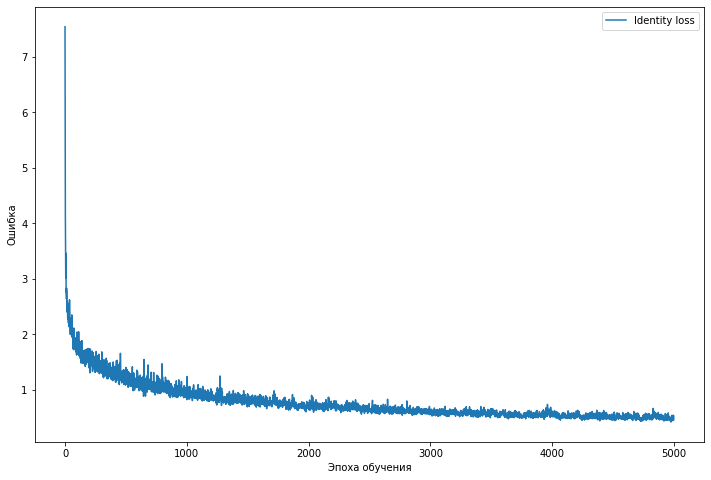

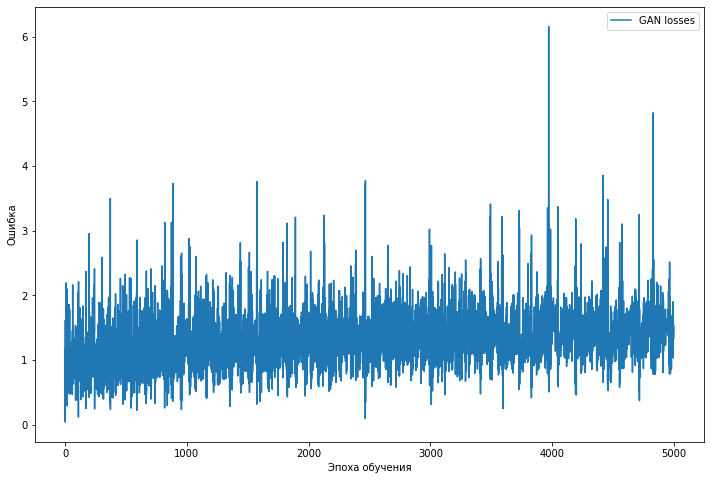

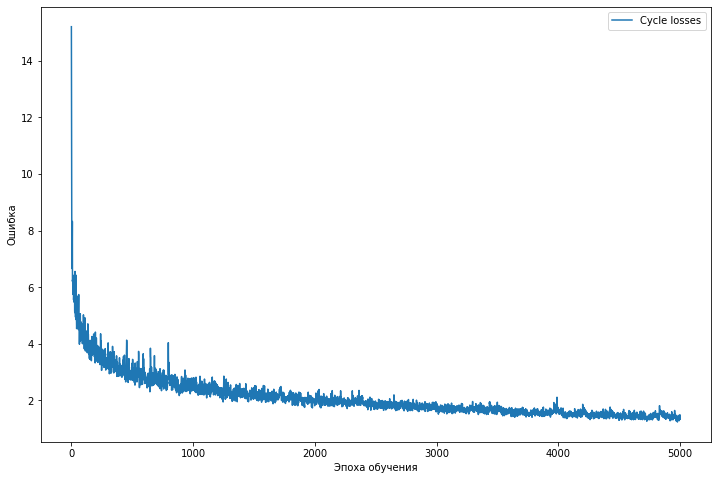

In [72]:
plot_losses(identity_losses, 'Identity loss')
plot_losses(gan_losses, 'GAN losses')
plot_losses(cycle_losses, 'Cycle losses')


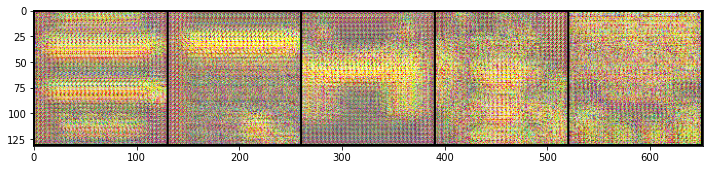

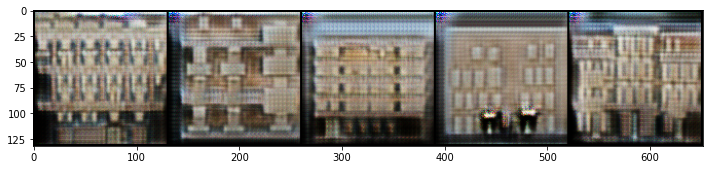

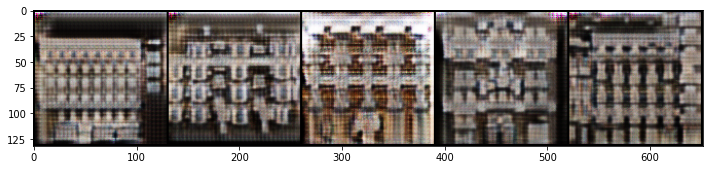

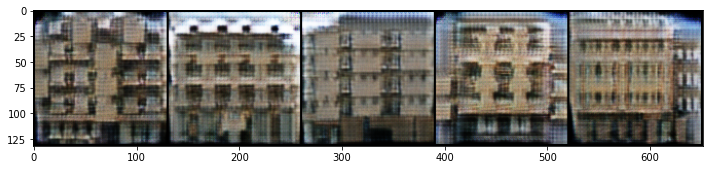

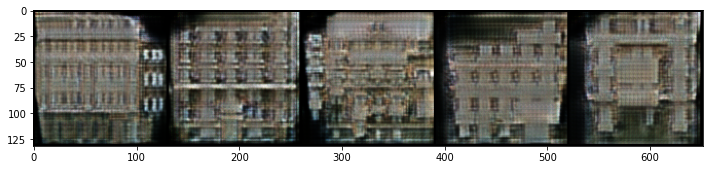

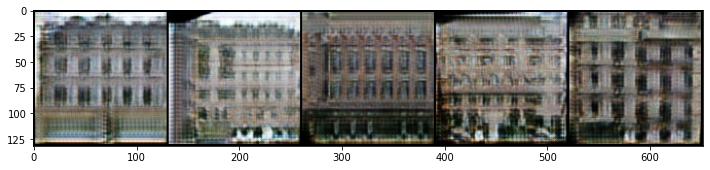

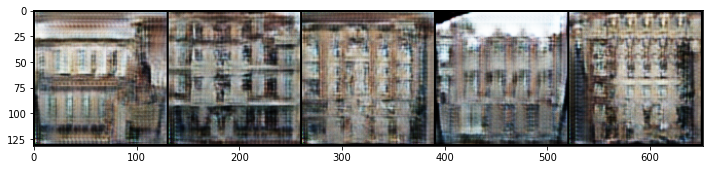

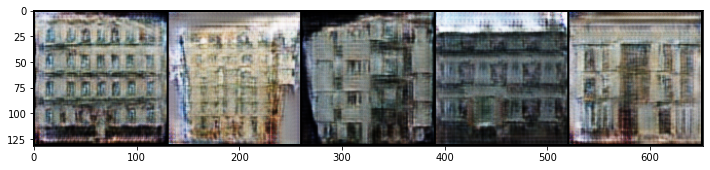

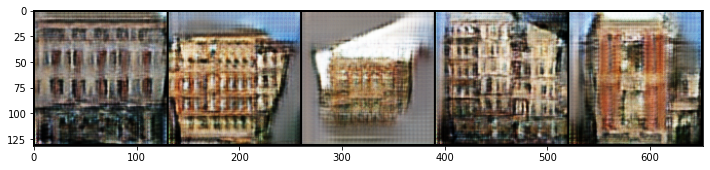

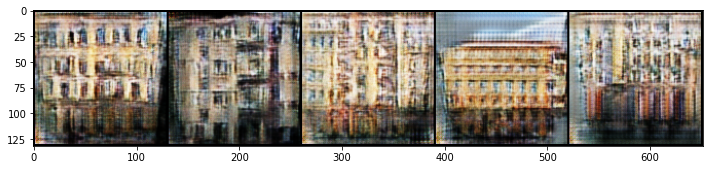

In [75]:
sample_dir = '/content/test'
for i in range(0, 4000, 400):
  img_path = "%s/%05d.png" % (sample_dir, i)
  sample_image = Image.open(img_path)
  plt.figure(figsize = (12,12))
  plt.imshow(sample_image) 
plt.show()